In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.cm as cm
from matplotlib.cm import ScalarMappable


import scipy
import numpy as np
import pandas as pd
import datetime as dt

from pathlib import Path
import soundfile as sf
from tqdm import tqdm
from sklearn.cluster import KMeans
import scipy.signal as signal
import scipy.special as special

from matplotlib.patches import Circle

In [2]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
from pipeline import pipeline
from cfg import get_config

import bout.clustering as clstr
import bout.assembly as bt

In [3]:
from models.bat_call_detector.model_detector import BatCallDetector

In [4]:
SAMPLERATE = 250000
NUM_CHANNELS = 8
BYTES_PER_SAMPLE = 2 #int16

In [5]:
C = 343 # m/s speed of sound in air
FS = 250000
SNR_CALC_LENGTH = 0.030
SNR_OFFSET_BEFORE_CALL = 0.015
TIME_PAD_FOR_ECHO = 0.002
CORR_LENGTH = 0.025
SELECTED_CHANNEL_FOR_REF = 7
NUM_CHANNELS_TOTAL = 8
FILE_DURATION = 600
HOUR_TAG = 'hour_0'
ZMAG_REF_TO_6 = 29.125
ZMAG_REF_TO_7 = 31.6875
XMAG_REF_TO_1 = 17.7
YMAG_REF_TO_6 = 21
YMAG_REF_TO_1 = 37.5
A_LOCS_MAT = np.array([[-XMAG_REF_TO_1, -YMAG_REF_TO_1, ZMAG_REF_TO_7],
                    [-XMAG_REF_TO_1, YMAG_REF_TO_1, ZMAG_REF_TO_7],
                    [-XMAG_REF_TO_1, -YMAG_REF_TO_1, 0],
                    [-XMAG_REF_TO_1, YMAG_REF_TO_1, 0],
                    [-XMAG_REF_TO_1, -YMAG_REF_TO_6, -ZMAG_REF_TO_6],
                    [-XMAG_REF_TO_1, YMAG_REF_TO_6, -ZMAG_REF_TO_6],
                    [0, 0, ZMAG_REF_TO_7],
                    [0, 0, 0]])

In [6]:
import UBNA_localize_process_GCC__20250505 as localize

In [7]:
def plot_snr_and_mic_labels(x_axis, y_axis):
    for i in np.linspace(0, x_axis.shape[0]-1, 11).astype(int):
        scale = 0.3
        t_x, t_y = x_axis[i]+scale, y_axis[i]+scale
        plt.text(x=t_x, y=t_y, s=f'det{round(i, 1)}', fontsize=14)

In [8]:
%matplotlib inline

file_dir = Path('/Volumes/Elements/UBNA_array_tests2025/mic_array_test_20250501/inUBNA/array')
site_key = 'Carp'
freq_key = ''

In [9]:
start_stop_file = (file_dir / 'Start_Stop_Times.txt')
with open(start_stop_file, "r", encoding="utf-8") as file:
    content = file.read()
    print(content)
    
start_stop_arr = content.split('\n')
start_of_session = start_stop_arr[0]
FILE_DATETIME = dt.datetime.strptime(start_of_session, 'Start time: %H:%M:%S %m/%d/%y UTC')

Start time: 03:30:14 05/02/25 UTC
Stop time: 04:38:26 05/02/25 UTC



In [10]:
%matplotlib inline

file_offset = 1800
FILE_TIME_TAG = f'{int(file_offset)}to{int(file_offset+FILE_DURATION)}'
dir_name = f'{HOUR_TAG}_{FILE_TIME_TAG}'
write_dir = file_dir / dir_name

microphones_used = np.array([1, 2, 4, 5, 6, 7, 8])
ind_of_selected_channel = np.where(microphones_used==(SELECTED_CHANNEL_FOR_REF+1))[0]
SELECTED_MIC_FOR_REF = microphones_used[ind_of_selected_channel]
non_ref_microphones_used = microphones_used[microphones_used!=SELECTED_MIC_FOR_REF]
num_good_channels = microphones_used.shape[0]
num_nonref_channels = num_good_channels-1

A_locs_mat_wrt_ref_channel = A_LOCS_MAT - A_LOCS_MAT[SELECTED_CHANNEL_FOR_REF]
A_locs_mat_tdoa_inches = A_locs_mat_wrt_ref_channel[(non_ref_microphones_used-1)]
A_locs_mat_tdoa_meters = A_locs_mat_tdoa_inches * (254/10000)

channel_dets = localize.get_dets_observed_from_all_channels(microphones_used, file_dir, file_offset)
channel_dets = channel_dets[channel_dets['KMEANS_CLASSES']=='LF'].copy()
channel_dets.sort_values(by='start_time', inplace=True)
channel_dets.reset_index(drop=True, inplace=True)
channel_dets['freq_group'] = channel_dets['KMEANS_CLASSES']
channel_dets['call_start_time'] = pd.to_timedelta(channel_dets['start_time']*1e9) + FILE_DATETIME
channel_dets['cycle_ref_time'] = pd.to_timedelta(channel_dets['start_time']*1e9) + FILE_DATETIME
channel_dets['call_end_time'] = pd.to_timedelta(channel_dets['end_time']*1e9) + FILE_DATETIME
channel_dets['start_time_wrt_ref'] = channel_dets['start_time']
channel_dets['end_time_wrt_ref'] = channel_dets['end_time']
removed_overlaps = localize.remove_overlapping_events(channel_dets, OVERLAP_TIME_THRESHOLD=12e-3)
snr_thresh_dets = removed_overlaps[removed_overlaps['SNR']>=20].copy()

In [11]:
# data_params = dict()
# data_params['site_tag'] = site_key
# data_params['type_tag'] = freq_key
# data_params['detector_tag'] = 'bd2'
# data_params['assembly_type'] = 'kmeans'
# file_paths = dict()
# file_paths["SITE_folder"] = f'/Users/adityakrishna/duty-cycle-investigation/data/2022_detector_summaries/{data_params["site_tag"]}'
# file_paths["detector_TYPE_SITE_YEAR"] = f'{data_params["detector_tag"]}__{data_params["type_tag"]}{data_params["site_tag"]}_2022_{data_params["assembly_type"]}'
# location_df = pd.read_csv(f'{file_paths["SITE_folder"]}/{file_paths["detector_TYPE_SITE_YEAR"]}.csv', index_col=0, low_memory=False)
# bout_params = bt.get_bout_params_from_location(location_df, data_params)

# tagged_dets = bt.classify_bouts_in_detector_preds_for_freqgroups(snr_thresh_dets, bout_params)
# bout_metrics = bt.construct_bout_metrics_from_location_df_for_freqgroups(tagged_dets)
# bout_metrics

In [12]:
COLOR_MAP_FOR_TRAJ = {0:cm.Blues, 1:cm.Reds, 2:cm.Greens}
MIC_MARKER_THICKNESS = 2
POINT_SIZE = 75

In [13]:
def plot_three_plane_trajectories(ax1, ax2, ax3, dets, good_bucket, bucket, mic_locs, color_ind):
    ax1.plot(good_bucket[0,:], good_bucket[1,:], alpha=0.4, linewidth=2, color='k')
    ax1.scatter(x=mic_locs[:,0], y=mic_locs[:,1], zorder=3, s=POINT_SIZE, 
                marker='x', linewidths=MIC_MARKER_THICKNESS, color='k')

    ax2.plot(good_bucket[1,:], good_bucket[2,:], alpha=0.4, linewidth=2, color='k')
    ax2.scatter(x=mic_locs[:,1], y=mic_locs[:,2], zorder=3, s=POINT_SIZE, 
                marker='x', linewidths=MIC_MARKER_THICKNESS, color='k')

    ax3.plot(good_bucket[0,:], good_bucket[2,:], alpha=0.4, linewidth=2, color='k')
    ax3.scatter(x=mic_locs[:,0], y=mic_locs[:,2], zorder=3, s=POINT_SIZE, 
                marker='x', linewidths=MIC_MARKER_THICKNESS, color='k')

    norm = plt.Normalize(vmin=min(dets['start_time']), vmax=max(dets['start_time']))
    for i in range(good_bucket.shape[1]):
        det = dets.iloc[i]
        line_color = COLOR_MAP_FOR_TRAJ[color_ind](norm(det['start_time']))
        ax1.scatter(bucket[0,i], bucket[1,i], color=line_color, edgecolor='k', alpha=1, s=POINT_SIZE, zorder=2)
        ax2.scatter(bucket[1,i], bucket[2,i], color=line_color, edgecolor='k', alpha=1, s=POINT_SIZE, zorder=2)
        ax3.scatter(bucket[0,i], bucket[2,i], color=line_color, edgecolor='k', alpha=1, s=POINT_SIZE, zorder=2)

In [14]:
def plot_colored_dets_over_audio(audio_features, spec_features, plot_dets):
    audio_seg = audio_features['audio_seg']
    fs = audio_features['sample_rate']
    start = audio_features['start']
    file_offset = audio_features['file_offset']
    duration = audio_features['duration']

    vmax = spec_features['vmax']
    vmin = spec_features['vmin']
    cmap = spec_features['cmap']
    nfft = spec_features['NFFT']

    plt.figure(figsize=audio_features['figsize'])
    plt.rcParams.update({'font.size': 24})
    plt.title(f"Spectrogram of {audio_features['plot_title']}", fontsize=24)
    plt.specgram(audio_seg, NFFT=nfft, cmap=cmap, vmin=vmin, vmax=vmax, mode='magnitude', scale='dB')

    ax = plt.gca()
    for i, row in plot_dets.iterrows():
        rect = patches.Rectangle(((row['start_time'] - (start+file_offset))*(fs/2), row['low_freq']/(fs/2)), 
                        (row['end_time'] - row['start_time'])*(fs/2), (row['high_freq'] - row['low_freq'])/(fs/2), 
                        linewidth=2, edgecolor=localize.FREQ_COLORS[row['KMEANS_CLASSES']], facecolor='none', alpha=0.8)
        plt.axvline(x=(row['peak_frequency_time_SPECTROGRAM'] - start)*(fs/2), color='w', linestyle='dashed')
        plt.text(x=(row['start_time'] - (start+file_offset))*(fs/2), y=row['low_freq']/(fs/2), s=f"{round(row['SNR'], 2)}dB"
                 , color='w', fontsize=8, fontweight='bold')
        ax.add_patch(rect)

    plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
    plot_xtype = 'float'
    if (duration > 60):
        plot_xtype = 'int'
    plt.xticks(ticks=np.linspace(0, duration*(fs/2), 11), 
               labels=np.round(np.linspace((start+file_offset), (start+file_offset)+duration, 11, dtype=plot_xtype), 2), rotation=30)
    plt.ylabel("Frequency (kHz)")
    plt.xlabel("Time (s)")
    plt.show()

def plot_audio_bout(write_file, selected_channel_for_ref, start, length, file_offset, subset1, subset2):
    recorded_audio = sf.SoundFile(write_file)
    recorded_audio.seek(int(FS*start))
    audio_seg = recorded_audio.read(int(FS*length))
    highpassed_audio_seg = localize.highpass_audio_signal(audio_seg, FS, 20000)

    print(f'Currently at {write_file}')
    audio_features = dict()
    audio_features['figsize'] = (15, 3)
    audio_features['file_path'] = write_file
    audio_features['audio_seg'] = highpassed_audio_seg
    audio_features['sample_rate'] = FS
    audio_features['start'] = start
    audio_features['file_offset'] = file_offset
    audio_features['duration'] = length

    spec_features = dict()
    spec_features['NFFT'] = 256 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
    spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
    spec_features['vmin'] = -90
    spec_features['vmax'] = 0

    audio_features['plot_title'] = f"{audio_features['file_path'].stem} (mic {selected_channel_for_ref+1})"
    plot_colored_dets_over_audio(audio_features, spec_features, pd.DataFrame())
    plot_colored_dets_over_audio(audio_features, spec_features, subset1)
    plot_colored_dets_over_audio(audio_features, spec_features, subset2)

Currently at /Volumes/Elements/UBNA_array_tests2025/mic_array_test_20250501/inUBNA/array/hour_0_1800to2400/hour_0_channel7_1800to2400.WAV


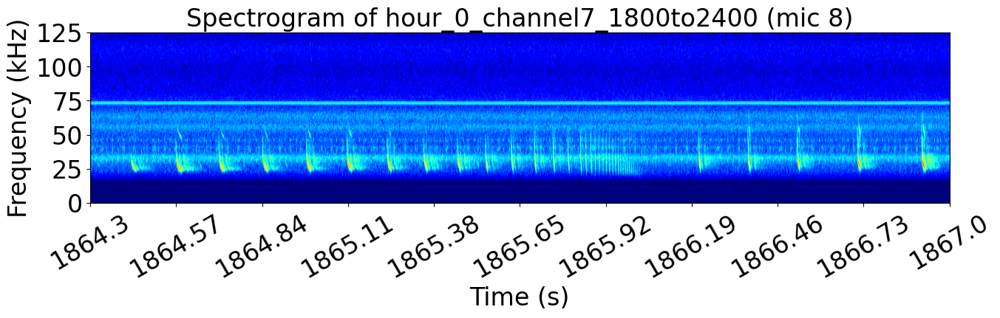

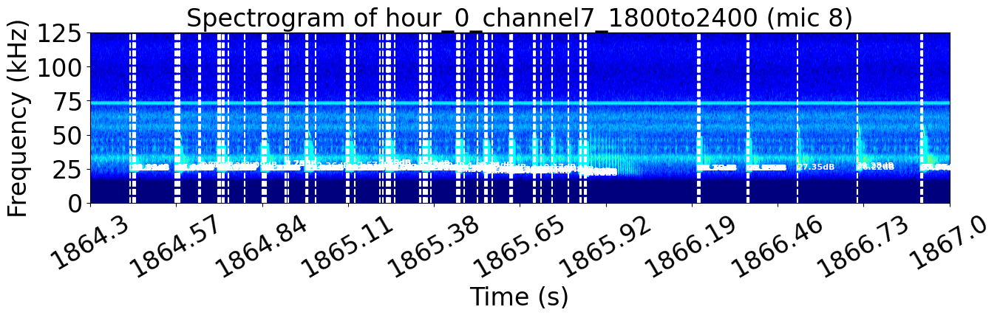

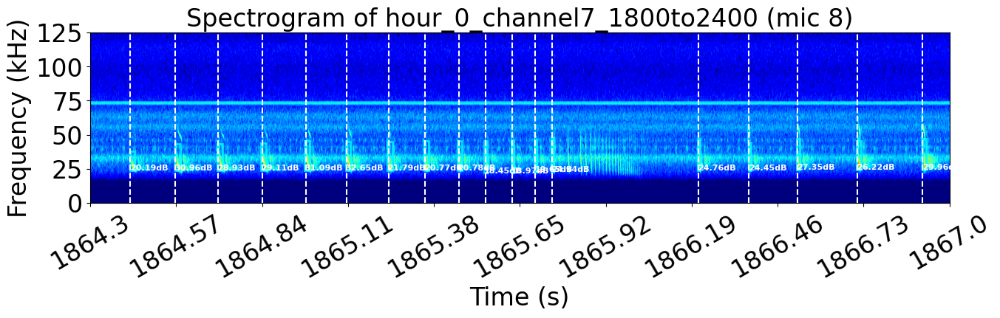

In [45]:
%matplotlib inline

write_file = write_dir / f'{HOUR_TAG}_channel{SELECTED_CHANNEL_FOR_REF}_{FILE_TIME_TAG}.WAV'

start = 64.3
length = 2.7
plot_channel_dets = channel_dets.loc[(channel_dets['start_time']>=(file_offset+start))&(channel_dets['end_time']<=(file_offset+start+length))]
plot_dets = removed_overlaps.loc[(removed_overlaps['start_time']>=(file_offset+start))&(removed_overlaps['end_time']<=(file_offset+start+length))]

set_for_tdoa = plot_dets[plot_dets['SNR']>=15].reset_index(drop=True).copy()
plot_audio_bout(write_file, SELECTED_CHANNEL_FOR_REF, start, length, file_offset, plot_channel_dets, set_for_tdoa)

In [46]:
plot_channel_dets.iloc[:8,1:-3]

,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file,freq_group,call_start_time,cycle_ref_time
6197,64.426060,31250.0,25920.0,20.190307,1864.4245,1864.4403,23750,37921,Nyctalus leisleri,0.350,0.636,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.424500,2025-05-02 04:01:18.424500
6198,64.435288,23437.5,26880.0,21.210562,1864.4265,1864.4400,23750,33601,Eptesicus serotinus,0.346,0.588,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.426500,2025-05-02 04:01:18.426500
6199,64.436728,23437.5,25920.0,17.492312,1864.4275,1864.4428,23750,33775,Nyctalus leisleri,0.281,0.587,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.427500,2025-05-02 04:01:18.427500
6200,64.435736,23437.5,25920.0,21.309035,1864.4285,1864.4440,23750,33378,Eptesicus serotinus,0.292,0.583,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.428500,2025-05-02 04:01:18.428500
6201,64.437312,23437.5,25920.0,20.431062,1864.4305,1864.4462,23750,31869,Nyctalus leisleri,0.380,0.628,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.430500,2025-05-02 04:01:18.430500
6202,64.437096,23437.5,25920.0,17.396295,1864.4315,1864.4464,23750,30273,Nyctalus leisleri,0.488,0.624,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.431500,2025-05-02 04:01:18.431500
6203,64.441960,23437.5,25920.0,12.376162,1864.4325,1864.4460,24609,31984,Nyctalus leisleri,0.372,0.625,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.432500,2025-05-02 04:01:18.432500
6204,64.442088,23437.5,25920.0,12.726831,1864.4325,1864.4480,23750,32722,Eptesicus serotinus,0.276,0.594,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.432500,2025-05-02 04:01:18.432500


In [47]:
set_for_tdoa

,KMEANS_CLASSES,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,...,individual,event,sampling_rate,input_file,freq_group,call_start_time,cycle_ref_time,call_end_time,start_time_wrt_ref,end_time_wrt_ref
0,LF,64.426060,31250.0,25920.0,20.190307,1864.4245,1864.4403,23750,37921,Nyctalus leisleri,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.424500,2025-05-02 04:01:18.424500,2025-05-02 04:01:18.440300,1864.4245,1864.4403
1,LF,64.568168,31250.0,25920.0,30.958897,1864.5665,1864.5832,23750,43511,Nyctalus leisleri,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.566500,2025-05-02 04:01:18.566500,2025-05-02 04:01:18.583200,1864.5665,1864.5832
2,LF,64.702568,31250.0,32640.0,28.929262,1864.7005,1864.7168,23750,43251,Nyctalus leisleri,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.700500,2025-05-02 04:01:18.700500,2025-05-02 04:01:18.716800,1864.7005,1864.7168
3,LF,64.840204,31250.0,32640.0,29.113740,1864.8375,1864.8535,23750,44020,Eptesicus serotinus,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.837500,2025-05-02 04:01:18.837500,2025-05-02 04:01:18.853500,1864.8375,1864.8535
4,LF,64.977316,31250.0,32640.0,31.087348,1864.9745,1864.9905,23750,45371,Eptesicus serotinus,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:18.974500,2025-05-02 04:01:18.974500,2025-05-02 04:01:18.990500,1864.9745,1864.9905
5,LF,65.105056,31250.0,32640.0,32.645393,1865.1025,1865.1182,23750,44991,Eptesicus serotinus,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:19.102500,2025-05-02 04:01:19.102500,2025-05-02 04:01:19.118200,1865.1025,1865.1182
6,LF,65.237112,31250.0,33600.0,21.793516,1865.2345,1865.2488,23750,44755,Eptesicus serotinus,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:19.234500,2025-05-02 04:01:19.234500,2025-05-02 04:01:19.248800,1865.2345,1865.2488
7,LF,65.352040,31250.0,32640.0,20.768035,1865.3495,1865.3632,23750,45234,Eptesicus serotinus,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:19.349500,2025-05-02 04:01:19.349500,2025-05-02 04:01:19.363200,1865.3495,1865.3632
8,LF,65.458020,31250.0,32640.0,20.784967,1865.4555,1865.4681,23750,45405,Eptesicus serotinus,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:19.455500,2025-05-02 04:01:19.455500,2025-05-02 04:01:19.468100,1865.4555,1865.4681
9,LF,65.541456,31250.0,28800.0,18.451526,1865.5375,1865.5462,22031,45363,Nyctalus noctula,...,-1,Echolocation,250000,/Volumes/Elements/UBNA_array_tests2025/mic_arr...,LF,2025-05-02 04:01:19.537500,2025-05-02 04:01:19.537500,2025-05-02 04:01:19.546200,1865.5375,1865.5462


In [48]:
set_for_tdoa['input_file'].iloc[1]

'/Volumes/Elements/UBNA_array_tests2025/mic_array_test_20250501/inUBNA/array/hour_0_1800to2400/hour_0_channel0_1800to2400.WAV'

In [49]:
def extract_call_starts_for_call(call_segment, det_info, start, approx_call_dur):
    mpl_specgram_window = plt.mlab.window_hanning(np.ones(32))
    f, t, Sxx = scipy.signal.spectrogram(call_segment, FS, detrend=False,
                                nfft=32, 
                                window=mpl_specgram_window)
    plt_Sxx = 10*np.log10(Sxx)
    max_ind = np.where(plt_Sxx==np.max(plt_Sxx))
    max_value_across_bins = Sxx[max_ind]
    peak_freq = f[max_ind[0]]
    peak_freq_time = t[max_ind[1]]

    found_call_dur = int(FS*(approx_call_dur+0.002))
    found_call_start = int(FS*(peak_freq_time[0] - 0.005))
    return found_call_start, found_call_dur

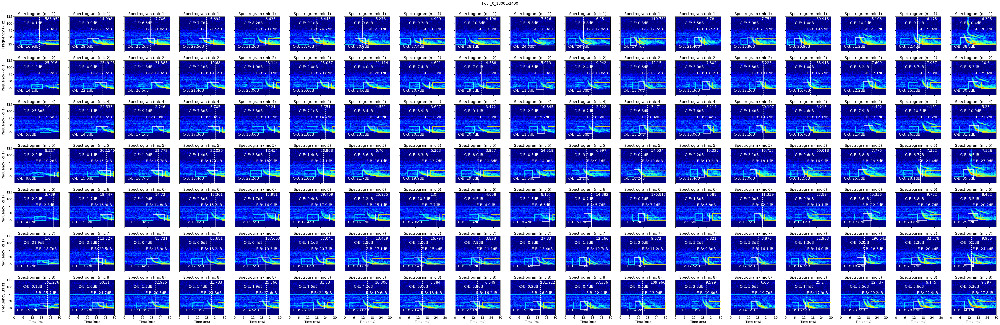

In [50]:
%matplotlib inline

example_calls = np.zeros((set_for_tdoa.shape[0], num_good_channels, int(FS*SNR_CALC_LENGTH)), dtype=np.float64)
example_call_snrs = np.zeros((set_for_tdoa.shape[0], num_good_channels), dtype=np.float64)
example_snr_facs = np.zeros((set_for_tdoa.shape[0], num_good_channels), dtype=np.float64)
example_det_durs = np.zeros(set_for_tdoa.shape[0], dtype=np.float64)
examining_df = set_for_tdoa[::].copy()
call_num = 0
plt.figure(figsize=(3*len(examining_df), 2.5*num_good_channels))
plt.rcParams.update({'font.size': 12})
plt.suptitle(f'{HOUR_TAG}_{FILE_TIME_TAG}', y=1.0, fontsize=14)
channel_num = 0
for selected_channel in (microphones_used-1):
    for i, det in examining_df.iterrows():
        start = det['start_time'] - file_offset - SNR_OFFSET_BEFORE_CALL
        approx_call_dur = localize.get_approx_call_dur(det)
        example_det_durs[i] = approx_call_dur

        write_file = write_dir / f'{HOUR_TAG}_channel{selected_channel}_{FILE_TIME_TAG}.WAV'
        call_num+=1
        
        filtered_det = localize.extract_highpassed_detection_from_wavfilepath(write_file, start, SNR_CALC_LENGTH, det)
        example_calls[i, channel_num,:] = filtered_det

        found_call_start, found_call_dur = extract_call_starts_for_call(filtered_det, det, start, approx_call_dur)
        found_call_end = (found_call_start+found_call_dur)
        echo_pad = int(FS*TIME_PAD_FOR_ECHO)
        found_call, found_background, found_echo = localize.extract_approx_call_windows_for_snr_calcs(filtered_det, 
                                                                                                found_call_start, 
                                                                                                found_call_dur)
        mpl_specgram_window = plt.mlab.window_hanning(np.ones(32))
        f, t, Sxx = scipy.signal.spectrogram(filtered_det, FS, detrend=False,
                                    nfft=32, 
                                    window=mpl_specgram_window)
        plt_Sxx = 10*np.log10(Sxx)
        max_ind = np.where(plt_Sxx==np.max(plt_Sxx))
        max_value_across_bins = Sxx[max_ind]
        peak_freq = f[max_ind[0]]
        peak_freq_time = t[max_ind[1]]

        snrce = localize.get_snr_from_band_limited_signal(found_call, found_echo)
        snrcb = localize.get_snr_from_band_limited_signal(found_call, found_background)
        snreb = localize.get_snr_from_band_limited_signal(found_echo, found_background)
        example_call_snrs[i, channel_num] = snrcb
        example_snr_facs[i, channel_num] = localize.snr_quality_metric(snrcb, snreb, snrce)

        spec_features = dict()
        spec_features['NFFT'] = 256 # When segments are short, NFFT should also be small to best see calls (must always be > 128)
        spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
        spec_features['vmin'] = -80
        spec_features['vmax'] = 0

        plt.subplot(num_good_channels, len(examining_df), call_num)
        plt.rcParams.update({'font.size': 12})
        plt.title(f"Spectrogram (mic {selected_channel+1})", fontsize=14)
        plt.specgram(filtered_det+1e-6, NFFT=spec_features['NFFT'], 
                        cmap='jet', vmin=spec_features['vmin'], vmax=spec_features['vmax'], mode='magnitude', scale='dB')
        plt.text(x=int(FS*0.003),y=0.78,s=f'C-E: {round(snrce, 1)}dB',color='w',fontsize=14)
        plt.text(x=int(FS*0.001),y=0.1,s=f'C-B: {round(snrcb, 1)}dB',color='w',fontsize=14)
        plt.text(x=int(FS*0.007),y=0.6,s=f'E-B: {round(snreb, 1)}dB',color='w',fontsize=14)
        plt.text(x=int(FS*0.010),y=0.9,s=f'{round(localize.snr_quality_metric(snrcb, snreb, snrce), 3)}',color='w',fontsize=14)
        plt.axvline(x=(peak_freq_time)*(FS/2), color='w', linestyle='dashed')
        ax = plt.gca()
        rect_call = patches.Rectangle((found_call_start/2, (det['low_freq']-2000)/(FS/2)), 
                        found_call_dur/2, ((det['high_freq']-det['low_freq'])+4000)/(FS/2), 
                        linewidth=2, edgecolor='white', facecolor='none', alpha=0.8)
        ax.add_patch(rect_call)
        rect_echo = patches.Rectangle(((found_call_end+echo_pad)/2, det['low_freq']/(FS/2)), 
                        ((FS*SNR_CALC_LENGTH) - (found_call_end+int(FS*0.002)))/2, (det['high_freq'] - det['low_freq'])/(FS/2), 
                        linewidth=2, edgecolor='yellow', facecolor='none', alpha=0.8)
        ax.add_patch(rect_echo)
        rect_background = patches.Rectangle(((found_call_start-found_call_dur)/2, det['low_freq']/(FS/2)), 
                        (found_call_dur)/2, (det['high_freq'] - det['low_freq'])/(FS/2), 
                        linewidth=2, edgecolor='cyan', facecolor='none', alpha=0.8)
        ax.add_patch(rect_background)
        if i==0:
            plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, FS/2000, 6).astype('int'))
            plt.ylabel("Frequency (kHz)", fontsize=14)
        else:
            plt.yticks(ticks=np.linspace(0, 1, 6), labels=['']*6)
        if selected_channel==(microphones_used[-1]-1):
            plt.xticks(ticks=np.linspace(0, SNR_CALC_LENGTH*(FS/2), 6), labels=(1000*np.linspace(0, 0+SNR_CALC_LENGTH, 6)).astype(int), rotation=0)
            plt.xlabel("Time (ms)")    
        else:
            plt.xticks(ticks=np.linspace(0, CORR_LENGTH*(FS/2), 6), labels=['']*6)
    channel_num+=1

plt.tight_layout()
plt.show()

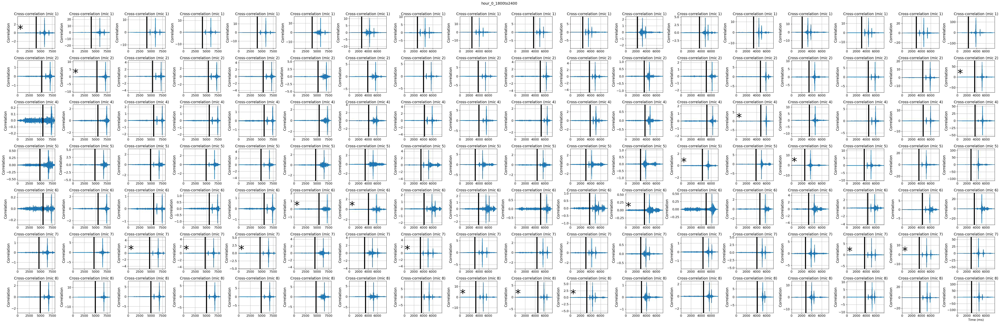

In [51]:
%matplotlib inline

channel_num = 0
plt.figure(figsize=(3*(example_calls.shape[0]), 2.5*num_good_channels))
plt.rcParams.update({'font.size': 12})
plt.suptitle(f'{HOUR_TAG}_{FILE_TIME_TAG}', y=1.0, fontsize=14)
for non_ref_call_i in range(num_good_channels):
    for det_num in range(example_calls.shape[0]):
        nonref_dets = example_calls[det_num]
        approx_call_dur = example_det_durs[det_num]
        ref_call_of_det = localize.index_reference_call_based_on_feature_to_maximize(example_calls, det_num, example_snr_facs)
        ref_channel_num = np.argmax(example_snr_facs[det_num])
        ref_mic_call_only = localize.extract_reference_call_only(ref_call_of_det, approx_call_dur)

        signal1 = nonref_dets[non_ref_call_i, :int(FS*CORR_LENGTH)]
        signal2 = ref_mic_call_only
        correlation = signal.correlate((signal1), (signal2), mode='full')
        lags = signal.correlation_lags(len(signal1), len(signal2), mode='full')
        max_lag_index = np.argmax(correlation)
        time_delay_in_samples = lags[max_lag_index]
        time_delay_in_seconds = time_delay_in_samples / FS

        channel_num+=1

        spec_features = dict()
        spec_features['NFFT'] = 132 # When segments are short, NFFT should also be small (must always be > 128)
        spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
        spec_features['vmin'] = -80
        spec_features['vmax'] = 0

        plt.subplot(num_good_channels, example_calls.shape[0], channel_num)
        plt.rcParams.update({'font.size': 12})
        plt.title(f"Cross-correlation (mic {microphones_used[non_ref_call_i]})", fontsize=14)
        plt.plot(correlation)
        if non_ref_call_i==ref_channel_num:
            plt.text(x=0, y=0, s='*', fontsize=42)
        plt.axvline(x=time_delay_in_samples, linewidth=4, color='k')
        plt.ylabel("Correlation", fontsize=14)
        plt.grid(which='both')
        plt.xlim(0, len(lags))

plt.xlabel("Time (ms)")    
plt.tight_layout()
plt.show()

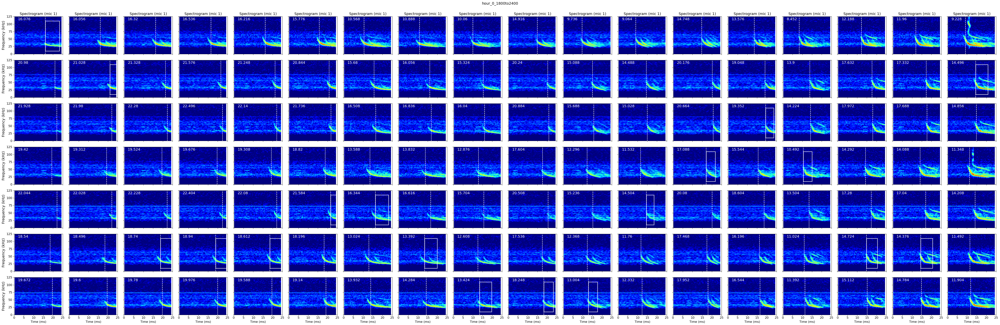

In [52]:
%matplotlib inline

example_t_delays_wrt_selected_channel = np.zeros((set_for_tdoa.shape[0], num_good_channels), dtype=np.float64)
channel_num = 0
plt.figure(figsize=(3*example_calls.shape[0], 2.5*num_good_channels))
plt.rcParams.update({'font.size': 12})
plt.suptitle(f'{HOUR_TAG}_{FILE_TIME_TAG}', y=1.0, fontsize=14)
for non_ref_call_i in range(num_good_channels):
    for det_num in range(example_calls.shape[0]):
        nonref_dets = example_calls[det_num]
        approx_call_dur = example_det_durs[det_num]
        ref_call_of_det = localize.index_reference_call_based_on_feature_to_maximize(example_calls, det_num, example_snr_facs)
        ref_mic_call_only = localize.extract_reference_call_only(ref_call_of_det, approx_call_dur)

        signal1 = nonref_dets[non_ref_call_i, :int(FS*CORR_LENGTH)]
        signal2 = ref_mic_call_only
        correlation = signal.correlate((signal1), (signal2), mode='full')
        corr_dB_norm = 20*np.log10(correlation/np.max(correlation))
        corr_thresh = -20
        corr_dB_norm[corr_dB_norm<=corr_thresh] = corr_thresh
        corr_dB_norm[np.isnan(corr_dB_norm)] = corr_thresh
        lags = signal.correlation_lags(len(signal1), len(signal2), mode='full')
        max_lag_index = np.argmax(corr_dB_norm)
        time_delay_in_samples = lags[max_lag_index]
        time_delay_in_seconds = time_delay_in_samples / FS

        example_t_delays_wrt_selected_channel[det_num, non_ref_call_i] = time_delay_in_seconds
        channel_num+=1

        spec_features = dict()
        spec_features['NFFT'] = 256 # When segments are short, NFFT should also be small (must always be > 128)
        spec_features['cmap'] = 'jet' # This colormap shows best contrast between noise and signals
        spec_features['vmin'] = -80
        spec_features['vmax'] = 0

        plt.subplot(num_good_channels, example_calls.shape[0], channel_num)
        plt.rcParams.update({'font.size': 12})
        if non_ref_call_i==0:
            plt.title(f"Spectrogram (mic {microphones_used[non_ref_call_i]})", fontsize=14)
        plt.specgram(signal1, NFFT=spec_features['NFFT'], cmap='jet', vmin=spec_features['vmin'], vmax=spec_features['vmax'], mode='magnitude', scale='dB')
        plt.text(x=int(FS*0.001),y=0.9,s=f'{round(1000*time_delay_in_seconds, 3)}',color='w',fontsize=14)
        plt.axvline(x=time_delay_in_samples/2, linestyle='dashed', color='w')
        ax = plt.gca()
        if non_ref_call_i==np.argmax(example_snr_facs[det_num]):
            rect_call = patches.Rectangle((time_delay_in_samples/2, (10000)/(FS/2)), len(ref_mic_call_only)/2, (100000)/(FS/2), 
                            linewidth=2, edgecolor='white', facecolor='none', alpha=0.8)
            ax.add_patch(rect_call)
        if det_num==0:
            plt.yticks(ticks=np.linspace(0, 1, 6), labels=np.linspace(0, FS/2000, 6).astype('int'))
            plt.ylabel("Frequency (kHz)", fontsize=14)
        else:
            plt.yticks(ticks=np.linspace(0, 1, 6), labels=['']*6)
        if non_ref_call_i==(num_good_channels-1):
            plt.xticks(ticks=np.linspace(0, CORR_LENGTH*(FS/2), 6), labels=(1000*np.linspace(0, 0+CORR_LENGTH, 6)).astype(int), rotation=0)
            plt.xlabel("Time (ms)")    
        else:
            plt.xticks(ticks=np.linspace(0, CORR_LENGTH*(FS/2), 6), labels=['']*6)

plt.tight_layout()
plt.show()

In [53]:
example_t_delays_wrt_selected_channel

array([[0.016076, 0.02098 , 0.021928, 0.01942 , 0.022044, 0.01854 ,
        0.019672],
       [0.016056, 0.021028, 0.02198 , 0.019312, 0.022028, 0.018496,
        0.0196  ],
       [0.01632 , 0.021328, 0.02228 , 0.019524, 0.022228, 0.01874 ,
        0.01978 ],
       [0.016536, 0.021576, 0.022496, 0.019676, 0.022404, 0.01894 ,
        0.019976],
       [0.016216, 0.021248, 0.02214 , 0.019308, 0.02208 , 0.018612,
        0.019588],
       [0.015776, 0.020844, 0.021736, 0.01882 , 0.021584, 0.018196,
        0.01914 ],
       [0.010568, 0.01568 , 0.016508, 0.013588, 0.016344, 0.013024,
        0.013932],
       [0.010888, 0.016056, 0.016836, 0.013832, 0.016616, 0.013392,
        0.014284],
       [0.01006 , 0.015324, 0.01604 , 0.012876, 0.015704, 0.012608,
        0.013424],
       [0.014916, 0.02024 , 0.020884, 0.017604, 0.020508, 0.017536,
        0.018248],
       [0.009736, 0.015088, 0.015688, 0.012296, 0.015236, 0.012368,
        0.013004],
       [0.009064, 0.014488, 0.015028, 0.011

In [54]:
microphones_used[ind_of_selected_channel]

array([8])

In [55]:
SELECTED_CHANNEL_FOR_REF = 7
ind_of_selected_channel = np.where(microphones_used==(SELECTED_CHANNEL_FOR_REF+1))[0]
SELECTED_MIC_FOR_REF = microphones_used[ind_of_selected_channel]
non_ref_microphones_used = microphones_used[microphones_used!=SELECTED_MIC_FOR_REF]
t_delay_8_to_selected_channel = example_t_delays_wrt_selected_channel[:,ind_of_selected_channel]
time_delay_mics_to_selected_ref_channel = (example_t_delays_wrt_selected_channel[:]) - (t_delay_8_to_selected_channel.reshape((len(t_delay_8_to_selected_channel), 1)))
time_delay_mics_to_selected_ref_channel_no_ref = np.delete(time_delay_mics_to_selected_ref_channel, ind_of_selected_channel, axis=1)
example_d_mics_to_ref = (time_delay_mics_to_selected_ref_channel_no_ref * C)
example_d_mics_to_ref

array([[-1.233428,  0.448644,  0.773808, -0.086436,  0.813596, -0.388276],
       [-1.215592,  0.489804,  0.81634 , -0.098784,  0.832804, -0.378672],
       [-1.18678 ,  0.530964,  0.8575  , -0.087808,  0.839664, -0.35672 ],
       [-1.17992 ,  0.5488  ,  0.86436 , -0.1029  ,  0.832804, -0.355348],
       [-1.156596,  0.56938 ,  0.875336, -0.09604 ,  0.854756, -0.334768],
       [-1.153852,  0.584472,  0.890428, -0.10976 ,  0.838292, -0.323792],
       [-1.153852,  0.599564,  0.883568, -0.117992,  0.827316, -0.311444],
       [-1.164828,  0.607796,  0.875336, -0.155036,  0.799876, -0.305956],
       [-1.153852,  0.6517  ,  0.897288, -0.187964,  0.78204 , -0.279888],
       [-1.142876,  0.683256,  0.904148, -0.220892,  0.77518 , -0.244216],
       [-1.120924,  0.714812,  0.920612, -0.242844,  0.765576, -0.218148],
       [-1.120924,  0.739508,  0.924728, -0.2744  ,  0.744996, -0.196196],
       [-1.098972,  0.762832,  0.930216, -0.296352,  0.729904, -0.166012],
       [-1.018024,  0.858

In [56]:
A_locs_mat_tdoa_inches

array([[-17.7   , -37.5   ,  31.6875],
       [-17.7   ,  37.5   ,  31.6875],
       [-17.7   ,  37.5   ,   0.    ],
       [-17.7   , -21.    , -29.125 ],
       [-17.7   ,  21.    , -29.125 ],
       [  0.    ,   0.    ,  31.6875]])

In [57]:
A_locs_mat_tdoa_meters

array([[-0.44958  , -0.9525   ,  0.8048625],
       [-0.44958  ,  0.9525   ,  0.8048625],
       [-0.44958  ,  0.9525   ,  0.       ],
       [-0.44958  , -0.5334   , -0.739775 ],
       [-0.44958  ,  0.5334   , -0.739775 ],
       [ 0.       ,  0.       ,  0.8048625]])

In [58]:
source_locs = np.zeros((4, example_d_mics_to_ref.shape[0]), dtype=np.float64)
for i in range(example_d_mics_to_ref.shape[0]):
    dm0_column = example_d_mics_to_ref[i,:].reshape((num_nonref_channels, 1))
    A_mat = np.hstack(((0-A_locs_mat_tdoa_meters), dm0_column))
        
    xm = A_locs_mat_tdoa_meters[:,0].reshape((num_nonref_channels, 1))
    ym = A_locs_mat_tdoa_meters[:,1].reshape((num_nonref_channels, 1))
    zm = A_locs_mat_tdoa_meters[:,2].reshape((num_nonref_channels, 1))

    wm0 = ((dm0_column**2) - (xm**2) - (ym**2) - (zm**2))/2

    xs, residuals, rank, sing_vals = np.linalg.lstsq(A_mat, wm0, rcond=None)

    source_locs[:,i] = xs.reshape((1,4))
source_locs

array([[-9.10065614e-01, -5.40517735e-01,  3.30384338e-01,
         3.22623497e-01,  4.96218972e-01,  1.07397855e+00,
         4.74278898e-01,  2.09944810e-02,  9.57653162e-02,
        -2.71989772e-03,  1.84280791e-01, -5.19514979e-02,
        -1.25658641e-01,  6.17857627e-01,  9.83980587e-01,
         1.15281264e+00,  1.67082999e+00,  2.40929559e+00],
       [-6.96593560e+00, -8.49889930e+00, -1.27743182e+01,
        -1.26487667e+01, -9.91593250e+00, -1.50266262e+01,
        -1.08199658e+01, -1.10953036e+01, -1.19627071e+01,
        -1.11533619e+01, -1.18523208e+01, -1.15312999e+01,
        -9.92028484e+00, -1.18618872e+01, -1.14001101e+01,
        -1.03178849e+01, -9.58750130e+00, -9.47832321e+00],
       [ 4.13535537e+00,  4.73876905e+00,  6.69141346e+00,
         6.40225677e+00,  4.95012416e+00,  7.09830354e+00,
         4.98984070e+00,  4.84562175e+00,  4.66997953e+00,
         3.94305732e+00,  3.78867914e+00,  3.33421243e+00,
         2.57911080e+00,  2.10988664e+00,  2.19073519e

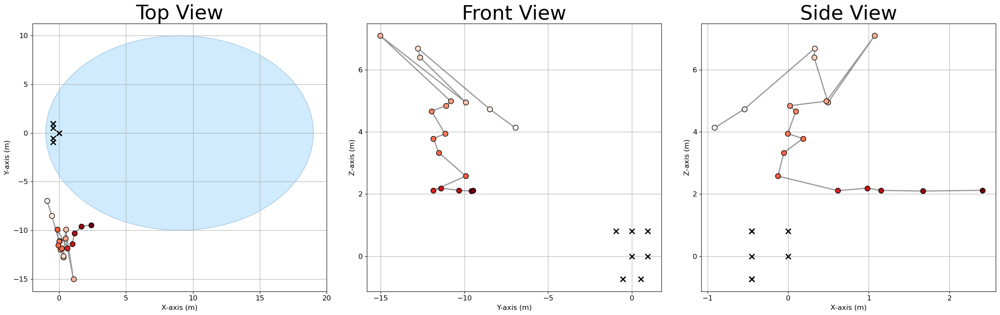

In [59]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
plt.rcParams.update({'font.size':28})
plot_three_plane_trajectories(ax1, ax2, ax3, set_for_tdoa, source_locs, source_locs, A_locs_mat_tdoa_meters, 1)

ax1.scatter(x=0, y=0, s=POINT_SIZE, zorder=3, marker='x', 
            linewidths=MIC_MARKER_THICKNESS, color='k', label='Microphones')
ax2.scatter(x=0, y=0, s=POINT_SIZE, zorder=3, marker='x', 
            linewidths=MIC_MARKER_THICKNESS, color='k', label='Microphones')
ax3.scatter(x=0, y=0, s=POINT_SIZE, zorder=3, marker='x', 
            linewidths=MIC_MARKER_THICKNESS, color='k', label='Microphones')

ax1.set_title('Top View')
ax1.grid(which='both')
ax1.set_xlabel('X-axis (m)')
ax1.set_ylabel('Y-axis (m)')
circle_center = (9, 0.0)   # (x, y) coordinates in metres  ← change here
circle_radius = 10.0          # metres                         ← and here

circle = Circle(
    circle_center,
    circle_radius,
    facecolor='lightskyblue',    # light-blue fill
    edgecolor='steelblue',       # slightly darker edge
    alpha=0.4,                   # 40 % opacity so trajectories stay visible
    zorder=1
)
ax1.add_patch(circle)

ax2.set_title('Front View')
ax2.grid(which='both')
ax2.set_xlabel('Y-axis (m)')
ax2.set_ylabel('Z-axis (m)')

ax3.set_title('Side View')
ax3.grid(which='both')
ax3.set_xlabel('X-axis (m)')
ax3.set_ylabel('Z-axis (m)')

plt.tight_layout()
plt.show()